In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import argparse
from typing import Any, Callable, Dict, List, Optional, Tuple, Union
import numpy as np
from PIL import Image
from pathlib import Path
from diffusers import StableDiffusionXLPipeline, AutoencoderKL
import torch
from diffusers.utils import make_image_grid

from utils.text_editing_SDXL import BlendedLatentDiffusionSDXL
from IPython.display import clear_output, display
import random

In [2]:
from transformers import Owlv2Processor, Owlv2ForObjectDetection, AutoImageProcessor, AutoModel
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import torch.nn.functional as F
import glob
import cv2
# from dreamsim import dreamsim

sim_type = "dino"
device = "cuda"

processor = Owlv2Processor.from_pretrained("google/owlv2-base-patch16-ensemble")
model = Owlv2ForObjectDetection.from_pretrained("google/owlv2-base-patch16-ensemble").to(device)

if sim_type == "dino":
    dino_preprocessor = AutoImageProcessor.from_pretrained('facebook/dinov2-base')
    dino_model = AutoModel.from_pretrained('facebook/dinov2-base').to(device)
else: # sim_type == "ds"
    ds_model, ds_preprocess = dreamsim(pretrained=True, device=device)

# ref_images = glob.glob('dataset/logo_example/avengers_refs/*.png')
ref_images = glob.glob('dataset/unlabeled_test/unlabeled_refs/*.png')
ref_images = [Image.open(ref_image).convert("RGB") for ref_image in ref_images]

@torch.no_grad()
def get_ref_embeddings(ref_images, sim_type="dino"):
    ref_embeddings = []
    if sim_type == "dino":
        for ref in ref_images:
            dino_input = dino_preprocessor(images=ref, return_tensors='pt').to(device)
            emb = dino_model(**dino_input).last_hidden_state.mean(dim=1)
            ref_embeddings.append(emb.to('cpu'))
        ref_embeddings = torch.cat(ref_embeddings, dim=0)
    else: # sim_type == "ds"
        for ref in ref_images:
            emb = ds_model.embed(ds_preprocess(ref).to(device)).cpu()
            ref_embeddings.append(emb)
        ref_embeddings = torch.cat(ref_embeddings, dim=0)

    return ref_embeddings

ref_embeddings = get_ref_embeddings(ref_images, sim_type=sim_type)


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [3]:
# defince blank class for args
class BreakAllLoops(Exception):
    pass

class Args:
    def __init__(self):
        self.device = 'cuda'
        self.batch_size = 3
        self.owl_threshold = 0.01
        self.similarity_minimum = 0.6
        self.similarity_maximum = 0.99
        self.margin = 50
        self.out_dir = 'output/test'
        
args = Args()
os.makedirs(args.out_dir, exist_ok=True)

In [4]:
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
bld = BlendedLatentDiffusionSDXL.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", vae=vae, torch_dtype=torch.float16, variant="fp16", use_safetensors=True)
bld = bld.to(args.device)
bld.load_ip_adapter("model/IP-Adapter", subfolder="sdxl_models", weight_name="ip-adapter_sdxl.bin")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


In [5]:
# functions
def get_bbox_coordinates_square(mask):
    """
    Given a 2D mask array with 0 and 1 values, find the bounding box coordinates of the square region with 1 values.

    Args:
    mask (np.ndarray): 2D numpy array of shape (1024, 1024) with 0 and 1 values.

    Returns:
    tuple: (min_row, min_col, max_row, max_col) coordinates of the square bounding box.
    """
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    
    min_row = np.where(rows)[0][0]
    max_row = np.where(rows)[0][-1]
    min_col = np.where(cols)[0][0]
    max_col = np.where(cols)[0][-1]
    
    # Calculate the width and height of the current bounding box
    height = max_row - min_row + 1
    width = max_col - min_col + 1
    
    # Determine the size of the square bounding box
    side_length = max(height, width)
    
    # Adjust the bounding box to be a square
    max_row = min_row + side_length - 1
    max_col = min_col + side_length - 1
    
    # Ensure that the bounding box does not exceed the image boundaries
    max_row = min(max_row, 1024 - 1)
    max_col = min(max_col, 1024 - 1)
    
    return (min_row, min_col, max_row, max_col)

@torch.no_grad()
def cosine_similarity_tensors(tensor_a, tensor_b):
    """
    Calculate the cosine similarity between two tensors.

    Parameters:
    tensor_a (torch.Tensor): A tensor of shape (a, 768)
    tensor_b (torch.Tensor): A tensor of shape (b, 768)

    Returns:
    torch.Tensor: A tensor of shape (a, b) containing the cosine similarities.
    """
    # Normalize the tensors along the last dimension
    a_normalized = F.normalize(tensor_a, p=2, dim=1)
    b_normalized = F.normalize(tensor_b, p=2, dim=1)

    # Compute the cosine similarity matrix
    cosine_similarity_matrix = torch.mm(a_normalized, b_normalized.T)

    return cosine_similarity_matrix

@torch.no_grad()
def detect_and_compare(processor, model, idx, original_image, image, ref_embeddings, args, min_box_size = 0.003, gray_scale=False, save=True, sim_type="dino"):
    owl_query = ["logo"]
    inputs = processor(text=owl_query, images=image, return_tensors="pt").to(args.device)
    with torch.no_grad():
        outputs = model(**inputs)
    target_sizes = torch.Tensor([image.size[::-1]])

    owl_results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=args.owl_threshold)
    boxes, scores, labels = owl_results[0]["boxes"].tolist(), owl_results[0]["scores"].tolist(), owl_results[0]["labels"].tolist()
        
    owl_results = {}
    metadata = []
    bboxes = []
    for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
        box = [round(i, 2) for i in box]
        bboxes.append(box)
        metadata.append({'box': box, 'score': score, 'label': label})
    owl_results['metadata'] = metadata
    owl_results['bbox'] = bboxes

    regions = []
    # if gray_scale:
    #     image = image.convert('L')
        
    for box, label in zip(boxes, labels):
        region = {"box": box, "crop": image.crop(box)}
        regions.append(region)

    if len(regions) == 0:
        return False
    
    image_ = image.copy()
    draw = ImageDraw.Draw(image_)

    crop_embeddings = []
    with torch.no_grad():
        for n, region in enumerate(regions):
            crop = region['crop']
            if gray_scale:
                crop = crop.convert('L').convert('RGB')
            if sim_type == "dino":
                dino_input = dino_preprocessor(images=crop, return_tensors='pt').to(args.device)
                emb = dino_model(**dino_input).last_hidden_state.mean(dim=1) # 1, 768
            else: # sim_type == "ds"
                emb = ds_model.embed(ds_preprocess(crop).to(args.device)) # 1, dsn
            crop_embeddings.append(emb)
            
        crop_embeddings = torch.cat(crop_embeddings, dim=0) # n_crops, 768
        cosine_similarity = cosine_similarity_tensors(crop_embeddings.to(args.device), ref_embeddings.to(args.device))
        # max_similarities = cosine_similarity.max(dim=1).values # n_crops
        max_similarities = cosine_similarity.mean(dim=1) # n_crops

    original_size = image.size
    normalized_bbox_sizes = [(box[2] - box[0]) * (box[3] - box[1]) / (original_size[0] * original_size[1]) for box in bboxes]
    logo_idxs = torch.where((max_similarities > args.similarity_minimum) & (max_similarities < args.similarity_maximum) & (torch.Tensor(normalized_bbox_sizes).to(args.device) > min_box_size))[0]

    if len(logo_idxs) > 0:
        logo_boxes = [list(map(int, regions[i]['box'])) for i in logo_idxs]
        for box in logo_boxes:
            draw.rectangle(box, outline="red", width=10)
        print(f"Logo detected in {idx}: max_similarities: {max_similarities[logo_idxs].max()}")
    else: # no logo detected
        print(f"No logo detected in {idx}: max_similarities: {max_similarities.max()}")
        return False
   
    mask = np.zeros(original_size[::-1])
    margin_mask = np.zeros(original_size[::-1])

    for box in logo_boxes:
        min_row, min_col, max_row, max_col = box
        mask[min_col:max_col, min_row:max_row] = 1

        # Add a margin around the bounding box
        margin_min_row = max(0, min_row - args.margin)
        margin_min_col = max(0, min_col - args.margin)
        margin_max_row = min(original_size[0], max_row + args.margin)
        margin_max_col = min(original_size[1], max_col + args.margin)
        margin_mask[margin_min_col:margin_max_col, margin_min_row:margin_max_row] = 1

    mask = Image.fromarray((mask * 255).astype(np.uint8))
    margin_mask = Image.fromarray((margin_mask * 255).astype(np.uint8))

    np_image = np.array(image)
    np_mask = np.array(mask)
    rgba_image = np.dstack((np_image, np.ones((np_image.shape[0], np_image.shape[1]), dtype=np.uint8) * 255))
    rgba_image[:, :, 3] = np.where(np_mask == 0, 0, 255)  # Set alpha to 0 where mask is 0, else 255
    cropped_region = Image.fromarray(rgba_image)

    pasted_image = original_image.copy()
    pasted_image.paste(cropped_region, (0, 0), cropped_region)

    if save:
        image.save(os.path.join(args.out_dir, f'{idx}/sdedit.png'))
        margin_mask.save(os.path.join(args.out_dir, f'{idx}/mask.png'))
        info_path = os.path.join(args.out_dir, f'{idx}/info.txt')
        with open(info_path, 'w') as f:
            for box, max_similarities in zip(logo_boxes, max_similarities[logo_idxs]):
                f.write(f"box: {box}, max_similarities: {max_similarities}\n")
        small_size = original_size[0] // 2, original_size[1] // 2
        small_size = original_size[0], original_size[1] 
        vis = make_image_grid([original_image.resize(small_size), image_.resize(small_size), margin_mask.resize(small_size)], 1, 3)
        vis.save(os.path.join(args.out_dir, f'{idx}/vis.png'))

        pasted_image.save(os.path.join(args.out_dir, f'{idx}/pasted.png'))

    return True

def get_squares_from_mask(mask, padding_ratio=0.1):
    """
    Given a mask image with zeros and ones (where ones form rectangles that may overlap),
    returns the coordinates of squares that include the regions with ones.
    Rectangles that overlap are grouped together, and a single square is created for each group.
    After padding, if any squares overlap, they are merged into new squares that encompass all overlapping squares.

    Parameters:
    - mask: 2D numpy array of shape (H, W), with values 0 or 1.
    - padding_ratio: float, the ratio to expand the squares beyond the bounding boxes.

    Returns:
    - final_squares: list of tuples (x1, y1, x2, y2) representing the top-left and bottom-right
                     coordinates of the squares.
    """
    # Convert the mask to a uint8 binary image
    mask = np.array(mask)
    mask_uint8 = (mask * 255).astype(np.uint8)

    # Find contours in the mask
    contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Extract bounding boxes for each contour
    rects = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        rects.append((x, y, x + w, y + h))  # (x1, y1, x2, y2)

    # Implement Union-Find to group overlapping rectangles
    parent = [i for i in range(len(rects))]

    def find(i):
        while parent[i] != i:
            parent[i] = parent[parent[i]]  # Path compression
            i = parent[i]
        return i

    def union(i, j):
        pi = find(i)
        pj = find(j)
        if pi != pj:
            parent[pj] = pi  # Union

    # Group overlapping rectangles
    for i in range(len(rects)):
        x1_i, y1_i, x2_i, y2_i = rects[i]
        for j in range(i + 1, len(rects)):
            x1_j, y1_j, x2_j, y2_j = rects[j]
            # Check if rectangles i and j overlap
            if (x1_i < x2_j and x2_i > x1_j and
                y1_i < y2_j and y2_i > y1_j):
                union(i, j)

    # Group rectangles by their parent
    groups = {}
    for i in range(len(rects)):
        p = find(i)
        if p not in groups:
            groups[p] = []
        groups[p].append(rects[i])

    # Get image dimensions
    height, width = mask.shape
    min_dim = min(height, width)

    initial_squares = []
    for group in groups.values():
        # Collect coordinates of all rectangles in the group
        x1_list = [rect[0] for rect in group]
        y1_list = [rect[1] for rect in group]
        x2_list = [rect[2] for rect in group]
        y2_list = [rect[3] for rect in group]
        # Compute the minimal bounding rectangle for the group
        x1 = min(x1_list)
        y1 = min(y1_list)
        x2 = max(x2_list)
        y2 = max(y2_list)
        w = x2 - x1
        h = y2 - y1

        # Calculate square size with padding
        square_size = max(w, h)
        padded_size = int(square_size * (1 + padding_ratio))
        padded_size = min(padded_size, min_dim)

        # Calculate center coordinates
        center_x = x1 + w // 2
        center_y = y1 + h // 2

        # Calculate new top-left coordinates
        half_size = padded_size // 2
        new_x1 = center_x - half_size
        new_y1 = center_y - half_size

        # Adjust coordinates to stay within image boundaries
        new_x1 = max(0, new_x1)
        new_y1 = max(0, new_y1)
        new_x2 = min(new_x1 + padded_size, width)
        new_y2 = min(new_y1 + padded_size, height)

        # Ensure the square has the correct size
        if new_x2 - new_x1 < padded_size:
            new_x1 = max(0, new_x2 - padded_size)
        if new_y2 - new_y1 < padded_size:
            new_y1 = max(0, new_y2 - padded_size)

        initial_squares.append((new_x1, new_y1, new_x2, new_y2))

    # Now, check for overlaps among the padded squares and merge them if they overlap
    # Implement Union-Find for the squares
    parent_square = [i for i in range(len(initial_squares))]

    def find_square(i):
        while parent_square[i] != i:
            parent_square[i] = parent_square[parent_square[i]]  # Path compression
            i = parent_square[i]
        return i

    def union_square(i, j):
        pi = find_square(i)
        pj = find_square(j)
        if pi != pj:
            parent_square[pj] = pi  # Union

    # Group overlapping squares
    for i in range(len(initial_squares)):
        x1_i, y1_i, x2_i, y2_i = initial_squares[i]
        for j in range(i + 1, len(initial_squares)):
            x1_j, y1_j, x2_j, y2_j = initial_squares[j]
            # Check if squares i and j overlap
            if (x1_i < x2_j and x2_i > x1_j and
                y1_i < y2_j and y2_i > y1_j):
                union_square(i, j)

    # Group squares by their parent
    square_groups = {}
    for i in range(len(initial_squares)):
        p = find_square(i)
        if p not in square_groups:
            square_groups[p] = []
        square_groups[p].append(initial_squares[i])

    # Create final squares by merging overlapping ones
    final_squares = []
    for group in square_groups.values():
        x1_list = [sq[0] for sq in group]
        y1_list = [sq[1] for sq in group]
        x2_list = [sq[2] for sq in group]
        y2_list = [sq[3] for sq in group]
        x1 = min(x1_list)
        y1 = min(y1_list)
        x2 = max(x2_list)
        y2 = max(y2_list)
        w = x2 - x1
        h = y2 - y1

        # Calculate square size
        square_size = max(w, h)

        # Adjust square size to not exceed image dimensions
        square_size = min(square_size, min_dim)

        # Calculate center coordinates
        center_x = x1 + w // 2
        center_y = y1 + h // 2

        # Calculate new top-left coordinates
        half_size = square_size // 2
        new_x1 = int(center_x - half_size)
        new_y1 = int(center_y - half_size)

        # Adjust coordinates to stay within image boundaries
        new_x1 = max(0, new_x1)
        new_y1 = max(0, new_y1)
        new_x2 = min(new_x1 + square_size, width)
        new_y2 = min(new_y1 + square_size, height)

        # Ensure the square has the correct size
        if new_x2 - new_x1 < square_size:
            new_x1 = max(0, new_x2 - square_size)
        if new_y2 - new_y1 < square_size:
            new_y1 = max(0, new_y2 - square_size)

        final_squares.append((new_x1, new_y1, new_x2, new_y2))

    return final_squares

In [6]:
def detect_visualize(image_path):
    threshold = 0.05
    images_ = []
    crops = []
    # for image in images:
    if isinstance(image_path, str):
        image = Image.open(image_path).convert("RGB")
    else:
        image = image_path

    query = ["logo"]
    text = query

    inputs = processor(text=query, images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)
    target_sizes = torch.Tensor([image.size[::-1]])

    results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=threshold)
    boxes, scores, labels = results[0]["boxes"].tolist(), results[0]["scores"].tolist(), results[0]["labels"].tolist()
        
    results = {}
    metadata = []
    bboxes = []
    for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
        box = [round(i, 2) for i in box]
        bboxes.append(box)
        metadata.append({'box': box, 'score': score, 'label': label})
    results['metadata'] = metadata
    results['bbox'] = bboxes

    image_ = image.copy()
    draw = ImageDraw.Draw(image_)

    regions = []
    for box, label in zip(boxes, labels):
        label_ = text[label]
        draw.rectangle(box, outline="green", width=10)
        region = {"box": box, "crop": image.crop(box)}
        regions.append(region)
        # regions.append([image.crop(box)])
        # draw.text((box[0], box[1]), label_, fill="black", font=ImageFont.load_default(50))
    # image_.resize((512, 512))
    # crops.append(region)
    # images_.append(image_)
    image_.resize((314, 314))
    return image_, regions

def gen_mask(bbox):
    bbox = list(map(int, bbox))
    mask = np.zeros((1024, 1024))
    min_row, min_col, max_row, max_col = bbox
    # mask[min_col:max_col, min_row:max_row] = 1
    margin_min_row = max(0, min_row - 50)
    margin_min_col = max(0, min_col - 50)
    margin_max_row = min(1024, max_row + 50)
    margin_max_col = min(1024, max_col + 50)
    mask[margin_min_col:margin_max_col, margin_min_row:margin_max_row] = 1

    mask = Image.fromarray((mask * 255).astype(np.uint8))
    return mask

In [7]:
import json
# metadata_path = "dataset/midjourney/metadata.jsonl"
metadata_path = "dataset/ghost_in_the_shell/metadata.jsonl"
base_dir = "/".join(metadata_path.split("/")[:-1])

metadata = []
with open(metadata_path, 'r') as f:
    for line in f:
        data = json.loads(line)
        metadata.append(data)


In [8]:
# load lora weight
# path = 'output/logo_personalization/avengers_test/save-3000/'
# path = 'output/logo_personalization/unlabeled_test/save-3000/'
# path = 'output/logo_personalization/unlabeled_test_step_6010/save-6000/'
path = 'output/logo_personalization/avengers_ghost_in_the_shell_step_9010/save-6000//'
bld.unload_lora_weights()
bld.load_lora_weights(path)

No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new
No LoRA keys associated to CLIPTextModelWithProjection found with the prefix='text_encoder_2'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModelWithProjection related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/new


In [9]:
metadata[0]

{'file_name': 'Art_of_Ghost_in_the_Shell_95.png',
 'text': 'a street with graffiti on it and trees'}

## Fully automatic

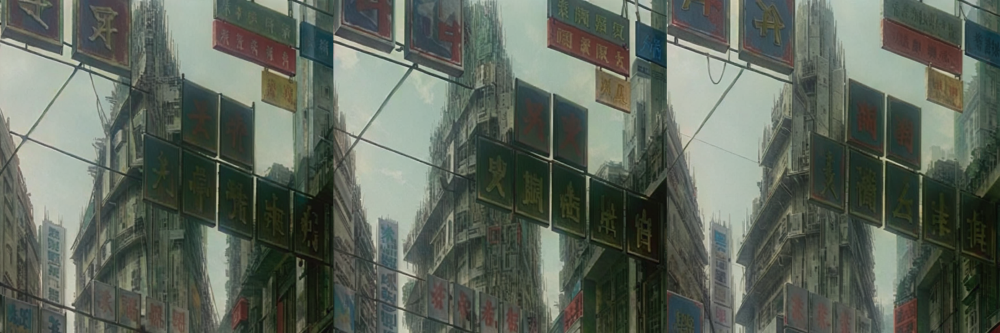

No logo detected in 20: max_similarities: 0.3296302258968353
No logo detected in 20: max_similarities: 0.316461980342865
No logo detected in 20: max_similarities: 0.3045080304145813
Mask generation failed. Retrying...


  0%|          | 0/15 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [13]:
idx = 20
info = metadata[idx]

image_path = f'{base_dir}/{info["file_name"]}'
prompt = info["text"]


seed = 123
TOK = "'A' logo"
# TOK = "'U' logo"

"""
Hyperparameters
"""
mask_gen_similarity_minimum = 0.57
# mask_gen_blending_start_percentage = [0.6] * 6
# mask_gen_guidance_scale = [5] * 6
mask_gen_blending_start_percentage = np.linspace(0.7, 0.7, 3).tolist()
mask_gen_guidance_scale = [5] * 3
args.margin = 50
# mask_gen_prompt = f'small {TOK} logo on it, carved, pasted'
mask_gen_prompt = f'{TOK}'
mask_gen_scale = {
    # "down": {"block_2": [0.0, 1.0]},
    "up": {"block_0": [0.0, 1.0, 0.0]},
}
mask_gen_scale = 1

inpaint_similarity_minimum = 0.60
inpaint_blending_start_percentage = np.linspace(0.7, 0.7, 3).tolist()
inpaint_guidance_scale = [5] * 3
# inpaint_prompt = f'small {TOK} logo on it, carved, pasted'
inpaint_prompt = f'{TOK}'
inpaint_scale = {
    "down": {"block_2": [0.0, 1.0]},
    "up": {"block_0": [0.0, 1.0, 0.0]},
}

refinement_blending_start_percentage = np.linspace(0.75, 0.75, 2).tolist()
refinement_guidance_scale = [5] * 2
refinement_padding_ratio = 0.7
refinement_scale = 1

MASK_GEN_TRY = 8
INPAINT_TRY = 2

#########################################################
os.makedirs(os.path.join(args.out_dir, str(idx)), exist_ok=True)
for _ in range(MASK_GEN_TRY):
    """
    Step 1: Mask Generation - Global SDEdit
    """
    bld.set_ip_adapter_scale(mask_gen_scale)
    args.blending_start_percentage = mask_gen_blending_start_percentage
    args.guidance_scale = mask_gen_guidance_scale
    num_iters = len(args.blending_start_percentage)

    args.init_image = image_path
    args.mask = f'dataset/all_mask.png'
    args.prompt = mask_gen_prompt
    seed += 1
    generator = torch.Generator(device='cuda').manual_seed(seed)
    bld.args = args
    imgs = []
    return_all_images = False
    # for i in range(num_iters):
    results = bld.edit_image(
        blending_percentage=args.blending_start_percentage,
        guidance_scale=args.guidance_scale,
        prompt=[args.prompt] * args.batch_size,
        generator=generator,
        num_iters=num_iters,
        cross_attention_kwargs={"scale": 1},
        return_all_images=return_all_images,
        ip_adapter_image=Image.open(args.init_image).convert("RGB"),
    )
    clear_output(wait=True)
    size = results[0].size
    display(make_image_grid([img.resize((size[0] // 2, size[1] // 2)) for img in results], 1, len(results)))
    

    """
    Step 2: Mask detection & Inpainting
    """
    args.blending_start_percentage = inpaint_blending_start_percentage
    args.guidance_scale = inpaint_guidance_scale
    num_iters = len(args.blending_start_percentage)
    args.prompt = inpaint_prompt
    bld.set_ip_adapter_scale(inpaint_scale)
    try:
        for i, image in enumerate(results):
            args.similarity_minimum = mask_gen_similarity_minimum
            success = detect_and_compare(processor, model, idx, Image.open(args.init_image).convert("RGB"), image, ref_embeddings, args, save=True)
            if success: # if mask gen is valid
                print("Mask generation succeeded, proceeding to inpainting...")
                # args.init_image = f'/c1/sangwon/poison_sdxl/dataset/midjourney/images/{idx}_0.png'
                args.init_image = os.path.join(args.out_dir, f'{idx}/pasted.png')
                args.mask = os.path.join(args.out_dir, f'{idx}/mask.png')
                bld.args = args
                for _ in range(INPAINT_TRY):    
                    results_ = bld.edit_image(
                        blending_percentage=args.blending_start_percentage,
                        guidance_scale=args.guidance_scale,
                        prompt=[args.prompt] * args.batch_size,
                        generator=generator,
                        num_iters=num_iters,
                        cross_attention_kwargs={"scale": 1},
                        return_all_images=return_all_images,
                        ip_adapter_image=Image.open(args.init_image).convert("RGB"),
                    )
                    clear_output(wait=True)
                    display(make_image_grid([img.resize((size[0] // 2, size[1] // 2)) for img in ([Image.open(args.mask)]+results_)], 1, len(results_)+1))
                    for j, image in enumerate(results_):
                        args.similarity_minimum = inpaint_similarity_minimum
                        success2 = detect_and_compare(processor, model, idx, Image.open(args.init_image).convert("RGB"), image, ref_embeddings, args, save=False)
                        if success2:
                            image.save(os.path.join(args.out_dir, f'{idx}/initial.png'))
                            clear_output(wait=True)
                            draw = ImageDraw.Draw(results_[j])
                            draw.rectangle((0, 0, *size), outline="red", width=10)
                            display(make_image_grid([img.resize((size[0] // 3, size[1] // 3)) for img in ([Image.open(args.mask)]+results_)], 1, len(results_)+1))
                            raise BreakAllLoops
                    print("Inpainting failed. Retrying...")
        print("Mask generation failed. Retrying...")
    except BreakAllLoops:
        print("Refinement step ...")
        break

"""
Step 3: Refinement step
"""
args.blending_start_percentage = refinement_blending_start_percentage
args.guidance_scale = refinement_guidance_scale
num_iters = len(args.blending_start_percentage)
# args.prompt = 'lotteria logo pasted on it'
bld.set_ip_adapter_scale(refinement_scale)

initial_image = Image.open(f'{args.out_dir}/{idx}/initial.png')
mask = Image.open(os.path.join(args.out_dir, f'{idx}/mask.png'))
outs = get_squares_from_mask(mask, padding_ratio=refinement_padding_ratio)

for i, out in enumerate(outs):
    # crop and zoom in
    square_axis = out[2] - out[0]
    original_size = initial_image.size
    crop_image = initial_image.crop(out).resize((1024, 1024))
    crop_image.save(f'{args.out_dir}/{idx}/{i}_crop_image.png')
    crop_mask = mask.crop(out).resize((1024, 1024))
    crop_mask.save(f'{args.out_dir}/{idx}/{i}_crop_mask.png')
    
    args.init_image = f'{args.out_dir}/{idx}/{i}_crop_image.png'
    args.mask = f'{args.out_dir}/{idx}/{i}_crop_mask.png'

    bld.args = args
    # single batch
    refined_zoom = bld.edit_image(
        blending_percentage=args.blending_start_percentage,
        guidance_scale=args.guidance_scale,
        prompt=[args.prompt] * 1,
        generator=generator,
        num_iters=num_iters,
        cross_attention_kwargs={"scale": 1},
        return_all_images=return_all_images,
        ip_adapter_image=Image.open(image_path).convert("RGB"),
    )[0] # 1024, 1024
    refined_zoom = refined_zoom.resize((square_axis, square_axis))
    initial_image.paste(refined_zoom, (out[0], out[1]))

initial_image.save(f'{args.out_dir}/{idx}/refined.png')

original = Image.open(image_path)
sdedit = Image.open(f'{args.out_dir}/{idx}/sdedit.png')
mask = Image.open(f'{args.out_dir}/{idx}/mask.png')
initial_image = Image.open(f'{args.out_dir}/{idx}/initial.png')
refined_image = Image.open(f'{args.out_dir}/{idx}/refined.png')

clear_output(wait=True)
display(make_image_grid([original, sdedit, mask, initial_image, refined_image], 1, 5))

## Human in the loop (step-by-step)

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

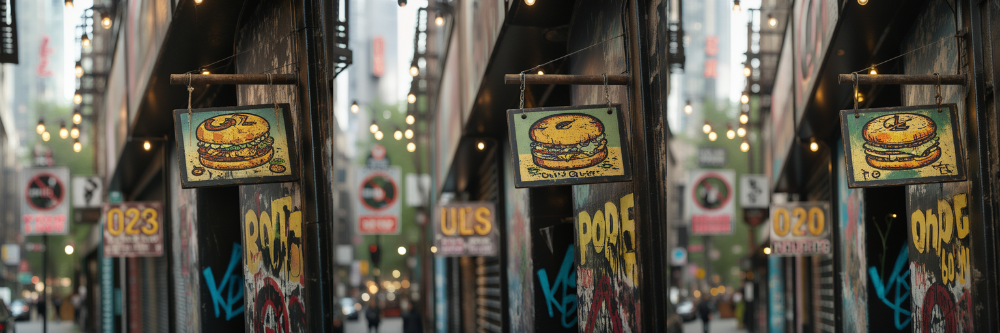

In [12]:
idx = 0
info = metadata[idx]

image_path = f'{base_dir}/{info["file_name"]}'
prompt = info["text"]


seed = 0
# TOK = "'A' logo"
TOK = "'U' logo"


"""
Hyperparameters
"""
detect_gray_scale = False

if sim_type == "dino":
    mask_gen_similarity_minimum = 0.55
    inpaint_similarity_minimum = 0.60
else: # sim_type == "ds"
    mask_gen_similarity_minimum = 0.50
    inpaint_similarity_minimum = 0.55


mask_gen_blending_start_percentage = np.linspace(0.7, 0.7, 3).tolist()
mask_gen_guidance_scale = [5] * 4
# mask_gen_blending_start_percentage = np.linspace(0.75, 0.75, 10).tolist()
# mask_gen_guidance_scale = [5] * 10
args.margin = 50
mask_gen_prompt = f'{TOK} logo on it, carved, pasted'
# mask_gen_scale = 1
mask_gen_scale = {
    # "down": {"block_2": [0.0, 1.0]},
    "up": {"block_0": [0.0, 1.0, 0.0]},
}

bld.set_ip_adapter_scale(mask_gen_scale)
args.blending_start_percentage = mask_gen_blending_start_percentage
args.guidance_scale = mask_gen_guidance_scale
num_iters = len(args.blending_start_percentage)

args.init_image = image_path
args.mask = f'dataset/all_mask.png'
args.prompt = mask_gen_prompt
# seed += 1
generator = torch.Generator(device='cuda').manual_seed(seed)
bld.args = args
imgs = []
return_all_images = False
# for i in range(num_iters):
results = bld.edit_image(
    blending_percentage=args.blending_start_percentage,
    guidance_scale=args.guidance_scale,
    prompt=[args.prompt] * args.batch_size,
    negative_prompt="watermark, sticker",
    generator=generator,
    num_iters=num_iters,
    cross_attention_kwargs={"scale": 1},
    return_all_images=return_all_images,
    ip_adapter_image=Image.open(args.init_image).convert("RGB"),
)
# clear_output(wait=True)
size = results[0].size
display(make_image_grid([img.resize((size[0] // 2, size[1] // 2)) for img in results], 1, len(results)))

Logo detected in 0: max_similarities: 0.5804900527000427
Mask generation succeeded, proceeding to inpainting...


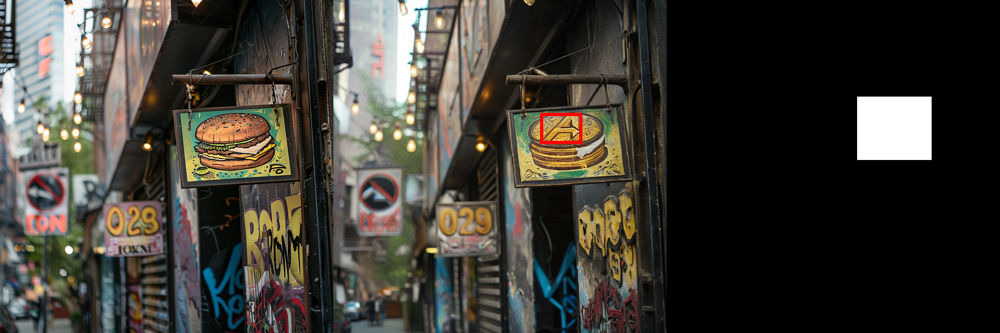

In [21]:
which = 2
os.makedirs(os.path.join(args.out_dir, str(idx)), exist_ok=True)
# for i, image in enumerate(results):
image = results[which]

args.similarity_minimum = 0.57
success = detect_and_compare(processor, model, idx, Image.open(args.init_image).convert("RGB"), image, ref_embeddings, args, min_box_size=0.001, gray_scale=detect_gray_scale, save=True, sim_type=sim_type)    
if success: # if mask gen is valid
    print("Mask generation succeeded, proceeding to inpainting...")
    display(Image.open(f'{args.out_dir}/{idx}/vis.png'))
else:
    detected, metadata = detect_visualize(image)
    display(detected.resize((314, 314)))

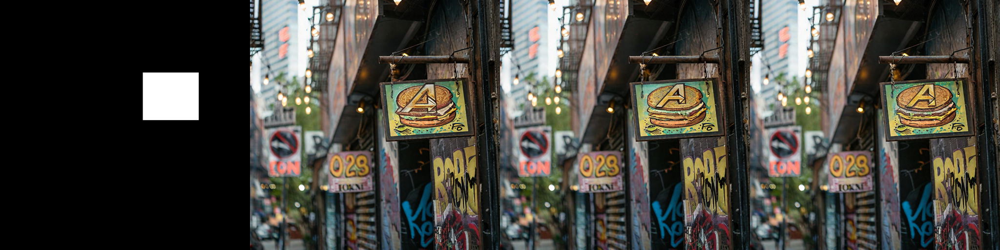

In [25]:
args.blending_start_percentage = np.linspace(0.65, 0.75, 4).tolist()
args.guidance_scale = [5] * 4
num_iters = len(args.blending_start_percentage)
args.prompt = f'{TOK} logo on it, carved, pasted'
bld.set_ip_adapter_scale({
    "down": {"block_2": [0.0, 1.0]},
    "up": {"block_0": [0.0, 1.0, 0.0]},
})

args.init_image = os.path.join(args.out_dir, f'{idx}/pasted.png')
args.mask = os.path.join(args.out_dir, f'{idx}/mask.png')
seed += 1
generator = torch.Generator(device='cuda').manual_seed(seed)
results_ = bld.edit_image(
    blending_percentage=args.blending_start_percentage,
    guidance_scale=args.guidance_scale,
    prompt=[args.prompt] * args.batch_size,
    negative_prompt="watermark, sticker",
    generator=generator,
    num_iters=num_iters,
    cross_attention_kwargs={"scale": 1},
    return_all_images=return_all_images,
    ip_adapter_image=Image.open(image_path).convert("RGB"),
)
clear_output(wait=True)
display(make_image_grid([img.resize((size[0] // 2, size[1] // 2)) for img in ([Image.open(args.mask)]+results_)], 1, len(results_)+1))

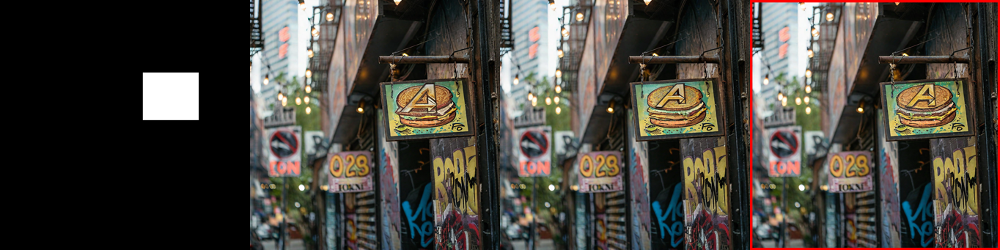

In [26]:
which = 2
args.similarity_minimum = 0.55

image = results_[which]
success2 = detect_and_compare(processor, model, idx, Image.open(args.init_image).convert("RGB"), image, ref_embeddings, args, gray_scale=detect_gray_scale, save=False, sim_type=sim_type) 
if success2:
    image.save(os.path.join(args.out_dir, f'{idx}/initial.png'))
    clear_output(wait=True)
    draw = ImageDraw.Draw(results_[which])
    draw.rectangle((0, 0, *size), outline="red", width=10)
    display(make_image_grid([img.resize((size[0] // 3, size[1] // 3)) for img in ([Image.open(args.mask)]+results_)], 1, len(results_)+1))


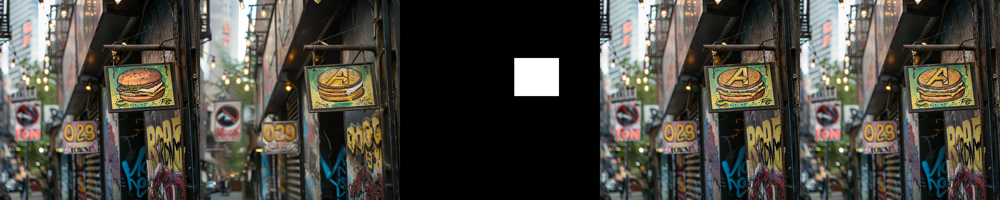

In [27]:
args.blending_start_percentage = np.linspace(0.7, 0.7, 2).tolist()
args.guidance_scale = [5] * 2
num_iters = len(args.blending_start_percentage)
args.prompt = f'{TOK} logo on it, carved, pasted'
bld.set_ip_adapter_scale(1)

initial_image = Image.open(f'{args.out_dir}/{idx}/initial.png')
mask = Image.open(os.path.join(args.out_dir, f'{idx}/mask.png'))
outs = get_squares_from_mask(mask, padding_ratio=0.7)
for i, out in enumerate(outs):
    # crop and zoom in
    square_axis = out[2] - out[0]
    original_size = initial_image.size
    crop_image = initial_image.crop(out).resize((1024, 1024))
    crop_image.save(f'{args.out_dir}/{idx}/{i}_crop_image.png')
    crop_mask = mask.crop(out).resize((1024, 1024))
    crop_mask.save(f'{args.out_dir}/{idx}/{i}_crop_mask.png')
    
    args.init_image = f'{args.out_dir}/{idx}/{i}_crop_image.png'
    args.mask = f'{args.out_dir}/{idx}/{i}_crop_mask.png'

    bld.args = args
    # single batch
    refined_zoom = bld.edit_image(
        blending_percentage=args.blending_start_percentage,
        guidance_scale=args.guidance_scale,
        prompt=[args.prompt] * 1,
        negative_prompt="watermark, sticker",
        generator=generator,
        num_iters=num_iters,
        cross_attention_kwargs={"scale": 1},
        return_all_images=return_all_images,
        # ip_adapter_image=Image.open(args.init_image).crop(out).convert("RGB"),
        ip_adapter_image=Image.open(image_path).crop(out).convert("RGB"),
    )[0] # 1024, 1024
    refined_zoom = refined_zoom.resize((square_axis, square_axis))
    initial_image.paste(refined_zoom, (out[0], out[1]))

initial_image.save(f'{args.out_dir}/{idx}/refined.png')

original = Image.open(image_path)
sdedit = Image.open(f'{args.out_dir}/{idx}/sdedit.png')
mask = Image.open(f'{args.out_dir}/{idx}/mask.png')
initial_image = Image.open(f'{args.out_dir}/{idx}/initial.png')
refined_image = Image.open(f'{args.out_dir}/{idx}/refined.png')

clear_output(wait=True)
display(make_image_grid([original, sdedit, mask, initial_image, refined_image], 1, 5))